In [1]:
import tensorflow as tf

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle

In [2]:
# Download caption annotation files
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
    annotation_zip = tf.keras.utils.get_file('captions.zip',
                                          cache_subdir=os.path.abspath('.'),
                                          origin = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                          extract = True)
    annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
    os.remove(annotation_zip)

# Download image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
    image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin = 'http://images.cocodataset.org/zips/train2014.zip',
                                      extract = True)
    PATH = os.path.dirname(image_zip) + image_folder
    os.remove(image_zip)
else:
    PATH = os.path.abspath('.') + image_folder
    
annotation_file = 'annotations/captions_train2014.json'

In [3]:
# Read the json file
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Store captions and image names in vectors
all_captions = []
all_img_name_vector = []

for annot in annotations['annotations']:
    caption = '<start> ' + annot['caption'] + ' <end>'
    image_id = annot['image_id']
    full_coco_image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (image_id)

    all_img_name_vector.append(full_coco_image_path)
    all_captions.append(caption)

# Shuffle captions and image_names together
# Set a random state
train_captions, img_name_vector = shuffle(all_captions,
                                          all_img_name_vector,
                                          random_state=1)

# Select the first 30000 captions from the shuffled set
# num_examples = 30000
# train_captions = train_captions[:num_examples]
# img_name_vector = img_name_vector[:num_examples]

In [4]:
len(train_captions), len(all_captions)

(414113, 414113)

In [5]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

In [6]:
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

In [7]:
# Get unique images
encode_train = sorted(set(img_name_vector))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in image_dataset:
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

In [8]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [9]:
# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [10]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [11]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [12]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [13]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

In [14]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    random_state=0)

In [15]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(331290, 331290, 82823, 82823)

In [16]:
# Feel free to change these parameters according to your system's configuration

BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [17]:
# Load the numpy files
def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap

In [18]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [19]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

        # hidden shape == (batch_size, hidden_size)
        # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
        hidden_with_time_axis = tf.expand_dims(hidden, 1)

        # score shape == (batch_size, 64, hidden_size)
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

        # attention_weights shape == (batch_size, 64, 1)
        # you get 1 at the last axis because you are applying score to self.V
        attention_weights = tf.nn.softmax(self.V(score), axis=1)

        # context_vector shape after sum == (batch_size, hidden_size)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector, attention_weights

In [20]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [21]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        self.attention = BahdanauAttention(self.units)

    def call(self, x, features, hidden):
        # defining attention as a separate model
        context_vector, attention_weights = self.attention(features, hidden)

        # x shape after passing through embedding == (batch_size, 1, embedding_dim)
        x = self.embedding(x)

        # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # passing the concatenated vector to the GRU
        output, state = self.gru(x)

        # shape == (batch_size, max_length, hidden_size)
        x = self.fc1(output)

        # x shape == (batch_size * max_length, hidden_size)
        x = tf.reshape(x, (-1, x.shape[2]))

        # output shape == (batch_size * max_length, vocab)
        x = self.fc2(x)

        return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [22]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [23]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

In [24]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [25]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # restoring the latest checkpoint in checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

In [26]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

In [27]:
@tf.function
def train_step(img_tensor, target):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            # passing the features through the decoder
            predictions, hidden, _ = decoder(dec_input, features, hidden)

            loss += loss_function(target[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    gradients = tape.gradient(loss, trainable_variables)

    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

In [28]:
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 1.8600
Epoch 1 Batch 100 Loss 1.0639
Epoch 1 Batch 200 Loss 0.8713
Epoch 1 Batch 300 Loss 0.8747
Epoch 1 Batch 400 Loss 0.7794
Epoch 1 Batch 500 Loss 0.7306
Epoch 1 Batch 600 Loss 0.7127
Epoch 1 Batch 700 Loss 0.6661
Epoch 1 Batch 800 Loss 0.7358
Epoch 1 Batch 900 Loss 0.6806
Epoch 1 Batch 1000 Loss 0.7074
Epoch 1 Batch 1100 Loss 0.7319
Epoch 1 Batch 1200 Loss 0.6598
Epoch 1 Batch 1300 Loss 0.6258
Epoch 1 Batch 1400 Loss 0.6502
Epoch 1 Batch 1500 Loss 0.6458
Epoch 1 Batch 1600 Loss 0.6487
Epoch 1 Batch 1700 Loss 0.6432
Epoch 1 Batch 1800 Loss 0.6894
Epoch 1 Batch 1900 Loss 0.6419
Epoch 1 Batch 2000 Loss 0.6491
Epoch 1 Batch 2100 Loss 0.7186
Epoch 1 Batch 2200 Loss 0.6635
Epoch 1 Batch 2300 Loss 0.6934
Epoch 1 Batch 2400 Loss 0.6455
Epoch 1 Batch 2500 Loss 0.6034
Epoch 1 Batch 2600 Loss 0.6110
Epoch 1 Batch 2700 Loss 0.5938
Epoch 1 Batch 2800 Loss 0.6678
Epoch 1 Batch 2900 Loss 0.6619
Epoch 1 Batch 3000 Loss 0.6133
Epoch 1 Batch 3100 Loss 0.6261
Epoch 1 Batch 3200 L

Epoch 5 Batch 5000 Loss 0.5242
Epoch 5 Batch 5100 Loss 0.5185
Epoch 5 Loss 0.534965
Time taken for 1 epoch 2551.3451311588287 sec

Epoch 6 Batch 0 Loss 0.6044
Epoch 6 Batch 100 Loss 0.5680
Epoch 6 Batch 200 Loss 0.5353
Epoch 6 Batch 300 Loss 0.5595
Epoch 6 Batch 400 Loss 0.4960
Epoch 6 Batch 500 Loss 0.5204
Epoch 6 Batch 600 Loss 0.5264
Epoch 6 Batch 700 Loss 0.5398
Epoch 6 Batch 800 Loss 0.5337
Epoch 6 Batch 900 Loss 0.4837
Epoch 6 Batch 1000 Loss 0.5119
Epoch 6 Batch 1100 Loss 0.5359
Epoch 6 Batch 1200 Loss 0.5446
Epoch 6 Batch 1300 Loss 0.5109
Epoch 6 Batch 1400 Loss 0.5923
Epoch 6 Batch 1500 Loss 0.5704
Epoch 6 Batch 1600 Loss 0.5252
Epoch 6 Batch 1700 Loss 0.4945
Epoch 6 Batch 1800 Loss 0.5407
Epoch 6 Batch 1900 Loss 0.5092
Epoch 6 Batch 2000 Loss 0.5422
Epoch 6 Batch 2100 Loss 0.5575
Epoch 6 Batch 2200 Loss 0.4669
Epoch 6 Batch 2300 Loss 0.5522
Epoch 6 Batch 2400 Loss 0.5317
Epoch 6 Batch 2500 Loss 0.5018
Epoch 6 Batch 2600 Loss 0.4848
Epoch 6 Batch 2700 Loss 0.5285
Epoch 6 Batch

Epoch 10 Batch 4400 Loss 0.5033
Epoch 10 Batch 4500 Loss 0.5438
Epoch 10 Batch 4600 Loss 0.4482
Epoch 10 Batch 4700 Loss 0.4919
Epoch 10 Batch 4800 Loss 0.4682
Epoch 10 Batch 4900 Loss 0.4792
Epoch 10 Batch 5000 Loss 0.4585
Epoch 10 Batch 5100 Loss 0.4663
Epoch 10 Loss 0.490341
Time taken for 1 epoch 2558.6328988075256 sec

Epoch 11 Batch 0 Loss 0.4668
Epoch 11 Batch 100 Loss 0.4521
Epoch 11 Batch 200 Loss 0.4965
Epoch 11 Batch 300 Loss 0.5025
Epoch 11 Batch 400 Loss 0.4570
Epoch 11 Batch 500 Loss 0.5291
Epoch 11 Batch 600 Loss 0.4860
Epoch 11 Batch 700 Loss 0.4977
Epoch 11 Batch 800 Loss 0.4817
Epoch 11 Batch 900 Loss 0.4808
Epoch 11 Batch 1000 Loss 0.4585
Epoch 11 Batch 1100 Loss 0.5020
Epoch 11 Batch 1200 Loss 0.4812
Epoch 11 Batch 1300 Loss 0.4946
Epoch 11 Batch 1400 Loss 0.4824
Epoch 11 Batch 1500 Loss 0.5091
Epoch 11 Batch 1600 Loss 0.4754
Epoch 11 Batch 1700 Loss 0.4786
Epoch 11 Batch 1800 Loss 0.4610
Epoch 11 Batch 1900 Loss 0.4521
Epoch 11 Batch 2000 Loss 0.4505
Epoch 11 Batch

Epoch 15 Batch 3100 Loss 0.4742
Epoch 15 Batch 3200 Loss 0.4375
Epoch 15 Batch 3300 Loss 0.5149
Epoch 15 Batch 3400 Loss 0.4451
Epoch 15 Batch 3500 Loss 0.4681
Epoch 15 Batch 3600 Loss 0.4367
Epoch 15 Batch 3700 Loss 0.4529
Epoch 15 Batch 3800 Loss 0.4700
Epoch 15 Batch 3900 Loss 0.4402
Epoch 15 Batch 4000 Loss 0.4039
Epoch 15 Batch 4100 Loss 0.4490
Epoch 15 Batch 4200 Loss 0.4402
Epoch 15 Batch 4300 Loss 0.4768
Epoch 15 Batch 4400 Loss 0.4551
Epoch 15 Batch 4500 Loss 0.4948
Epoch 15 Batch 4600 Loss 0.4608
Epoch 15 Batch 4700 Loss 0.4739
Epoch 15 Batch 4800 Loss 0.5408
Epoch 15 Batch 4900 Loss 0.4805
Epoch 15 Batch 5000 Loss 0.4390
Epoch 15 Batch 5100 Loss 0.4844
Epoch 15 Loss 0.463569
Time taken for 1 epoch 2556.9136748313904 sec

Epoch 16 Batch 0 Loss 0.4182
Epoch 16 Batch 100 Loss 0.4316
Epoch 16 Batch 200 Loss 0.4438
Epoch 16 Batch 300 Loss 0.5301
Epoch 16 Batch 400 Loss 0.4055
Epoch 16 Batch 500 Loss 0.4711
Epoch 16 Batch 600 Loss 0.4918
Epoch 16 Batch 700 Loss 0.4890
Epoch 16 Bat

Epoch 20 Batch 1800 Loss 0.4410
Epoch 20 Batch 1900 Loss 0.5083
Epoch 20 Batch 2000 Loss 0.4903
Epoch 20 Batch 2100 Loss 0.4466
Epoch 20 Batch 2200 Loss 0.4572
Epoch 20 Batch 2300 Loss 0.4731
Epoch 20 Batch 2400 Loss 0.4741
Epoch 20 Batch 2500 Loss 0.4838
Epoch 20 Batch 2600 Loss 0.4545
Epoch 20 Batch 2700 Loss 0.4975
Epoch 20 Batch 2800 Loss 0.4127
Epoch 20 Batch 2900 Loss 0.4708
Epoch 20 Batch 3000 Loss 0.4417
Epoch 20 Batch 3100 Loss 0.4629
Epoch 20 Batch 3200 Loss 0.4424
Epoch 20 Batch 3300 Loss 0.3894
Epoch 20 Batch 3400 Loss 0.4520
Epoch 20 Batch 3500 Loss 0.4448
Epoch 20 Batch 3600 Loss 0.4722
Epoch 20 Batch 3700 Loss 0.4288
Epoch 20 Batch 3800 Loss 0.4192
Epoch 20 Batch 3900 Loss 0.4681
Epoch 20 Batch 4000 Loss 0.4219
Epoch 20 Batch 4100 Loss 0.4142
Epoch 20 Batch 4200 Loss 0.4519
Epoch 20 Batch 4300 Loss 0.4884
Epoch 20 Batch 4400 Loss 0.4026
Epoch 20 Batch 4500 Loss 0.4445
Epoch 20 Batch 4600 Loss 0.4171
Epoch 20 Batch 4700 Loss 0.4291
Epoch 20 Batch 4800 Loss 0.4324
Epoch 20

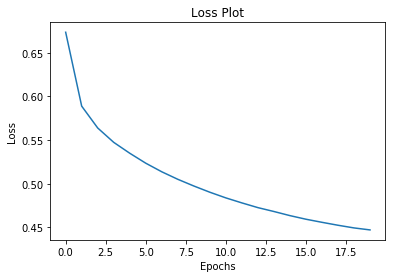

In [29]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

In [30]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [31]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Real Caption: <start> two boys are playing baseball on an outdoor field <end>
Prediction Caption: a baseball player running to catch the ball while they can hit the ball <end>


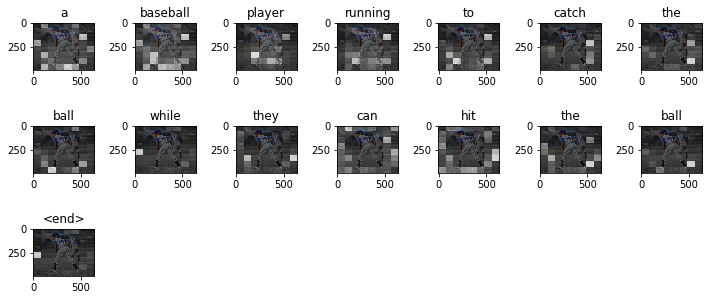

In [32]:
# captions on the validation set
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)


Prediction Caption: a man is on a surf board <end>


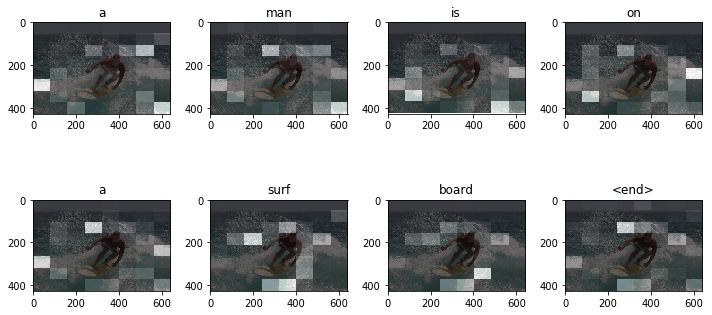

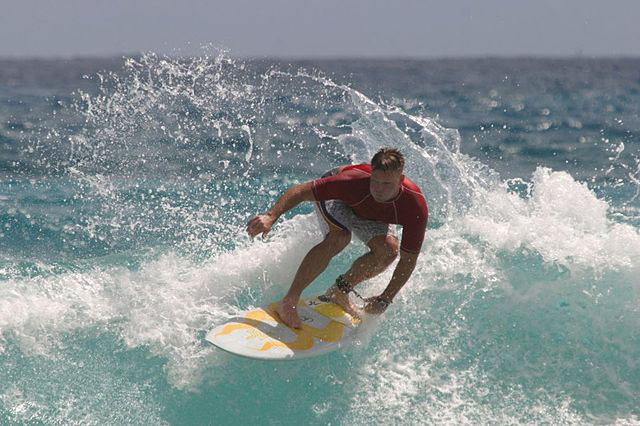

In [33]:
image_url = 'https://tensorflow.org/images/surf.jpg'
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     origin=image_url)

result, attention_plot = evaluate(image_path)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image_path, result, attention_plot)
# opening the image
Image.open(image_path)

In [34]:
def evaluate_fast(image):

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)


        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result

        dec_input = tf.expand_dims([predicted_id], 0)

    return result

['an', 'audience', 'and', 'a', 'fake', 'skull', 'designed', 'like', '<unk>', '<unk>', 'of', 'children', '<end>']


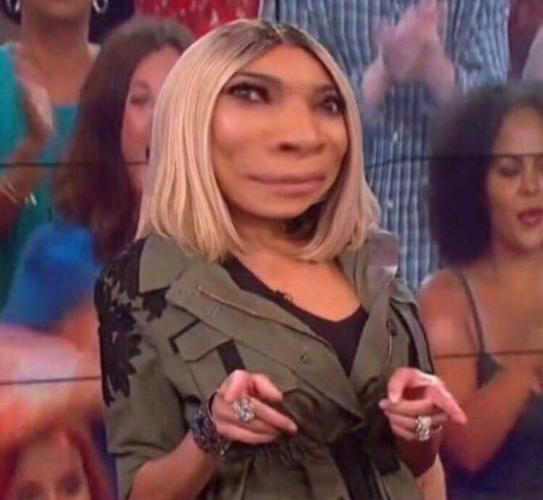

['a', 'man', 'wearing', 'cowboy', 'hat', 'stands', 'near', 'a', 'clock', 'and', 'a', 'big', 'smile', '<end>']


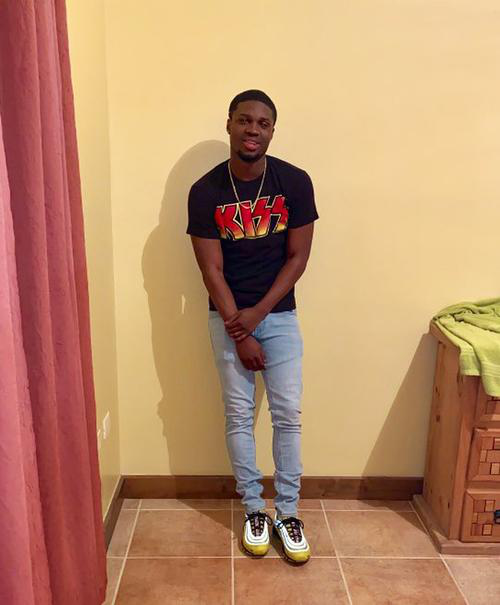

['a', 'old', 'man', 'in', 'a', '<unk>', 'blowing', 'out', 'of', 'a', 'sign', 'on', 'the', 'eye', '<unk>', 'you', 'can', 'see', 'a', 'beer', '<end>']


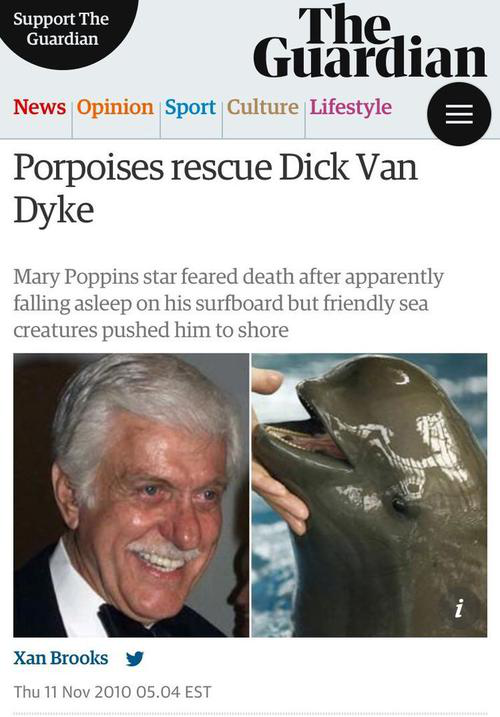

['a', 'smiling', 'driver', 'holding', 'a', 'shark', 'with', 'glasses', 'and', 'talk', 'on', 'a', 'white', 'car', '<end>']


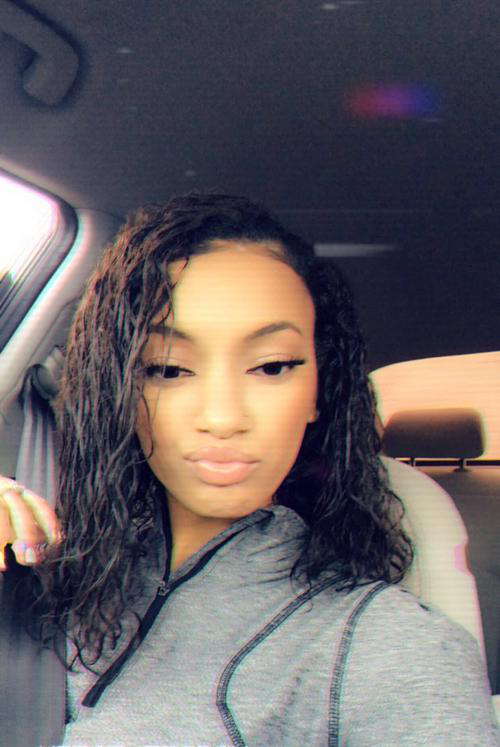

['a', 'person', 'standing', 'beside', 'a', 'tent', '<end>']


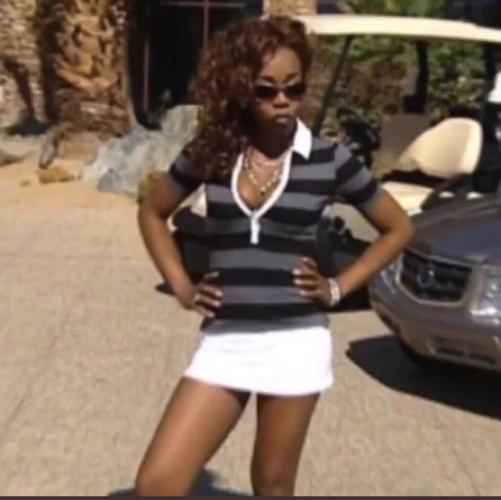

['a', 'man', 'in', 'a', 'suit', 'shop', 'talking', 'to', 'one', 'holding', 'plastic', 'in', 'large', 'room', '<end>']


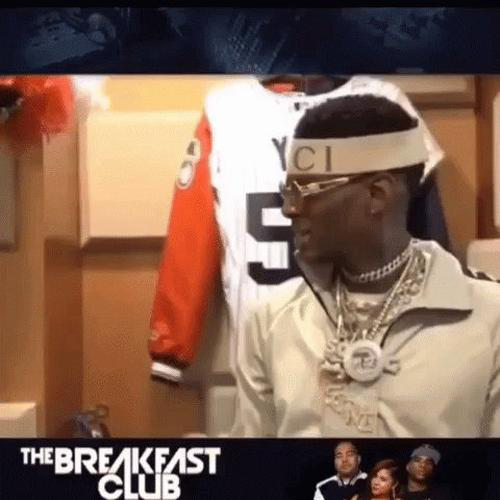

['a', 'person', 'on', 'a', 'bike', 'in', 'a', 'field', '<end>']


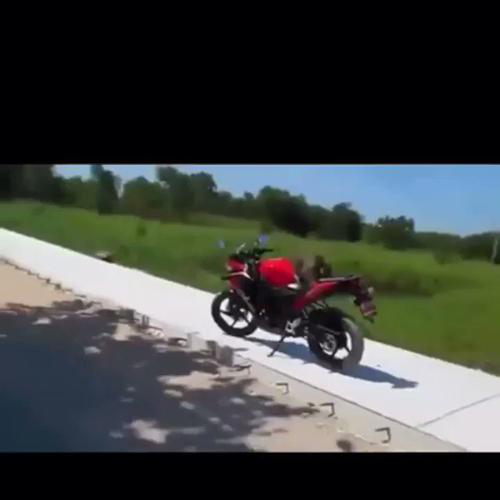

['a', 'young', 'girl', 'standing', 'in', 'front', 'of', 'a', 'woman', 'wearing', 'a', 'tie', '<end>']


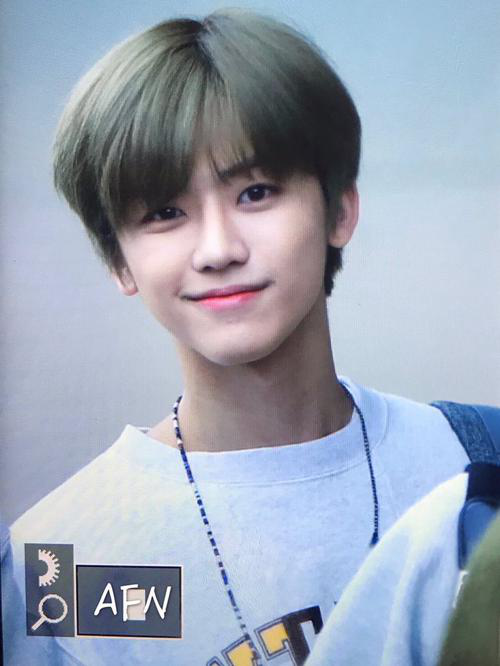

['a', 'woman', 'in', 'a', 'small', 'girl', 'with', 'colorful', 'flowers', 'and', 'a', 'small', 'panda', 'behind', 'a', 'red', 'toothbrush', '<end>']


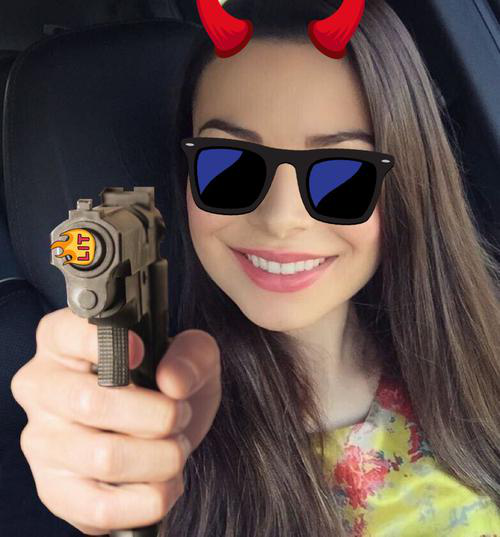

['a', 'little', 'boy', 'standing', 'in', 'a', 'grass', 'with', 'arms', 'in', 'a', 'field', 'behind', 'a', 'tall', 'palm', 'forest', 'field', '<end>']


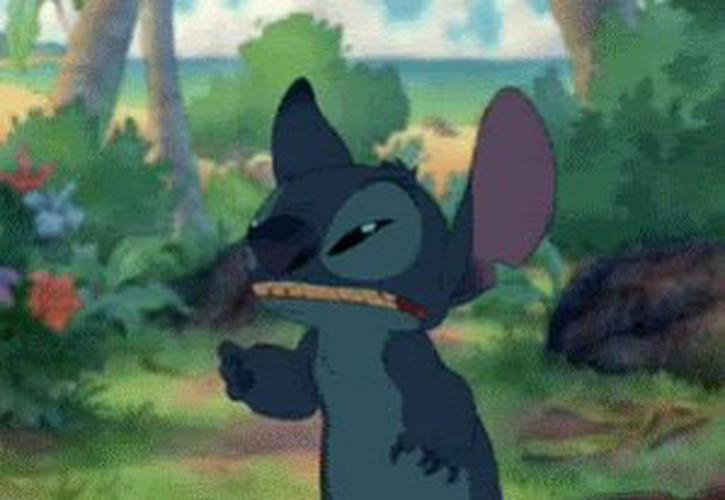

['overview', 'of', 'people', 'standing', 'in', 'the', '<unk>', 'of', 'the', 'feet', 'high', 'heels', '<end>']


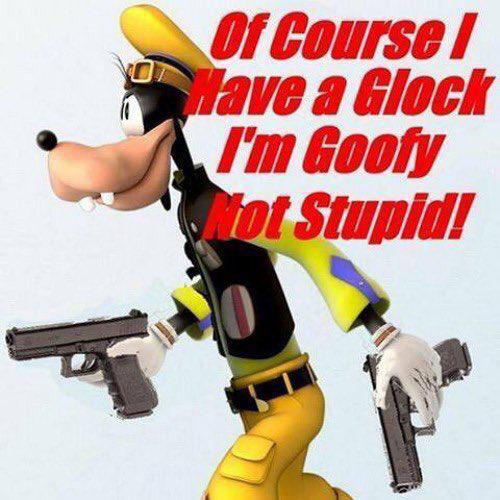

['a', 'bunch', 'of', 'skateboards', 'on', 'some', 'surfing', 'equipment', '<end>']


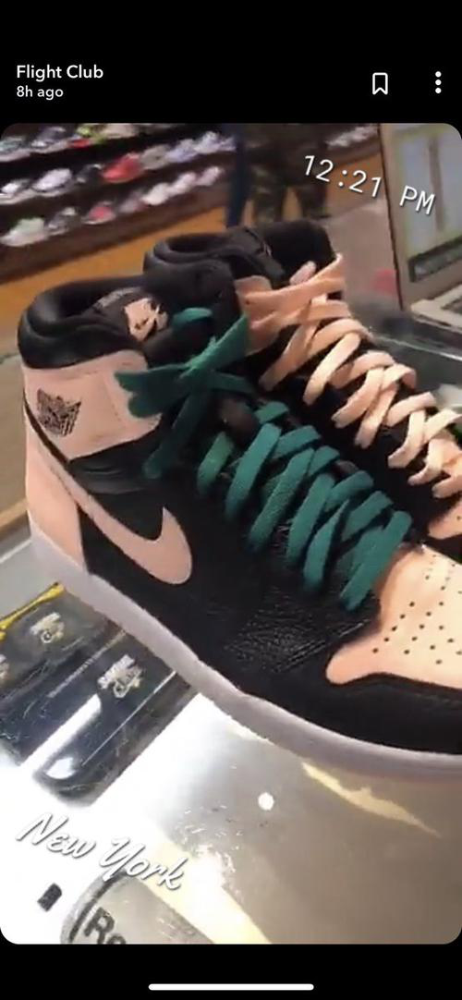

['a', 'woman', 'wearing', 'a', '<unk>', 'glass', 'of', 'wine', 'glass', '<end>']


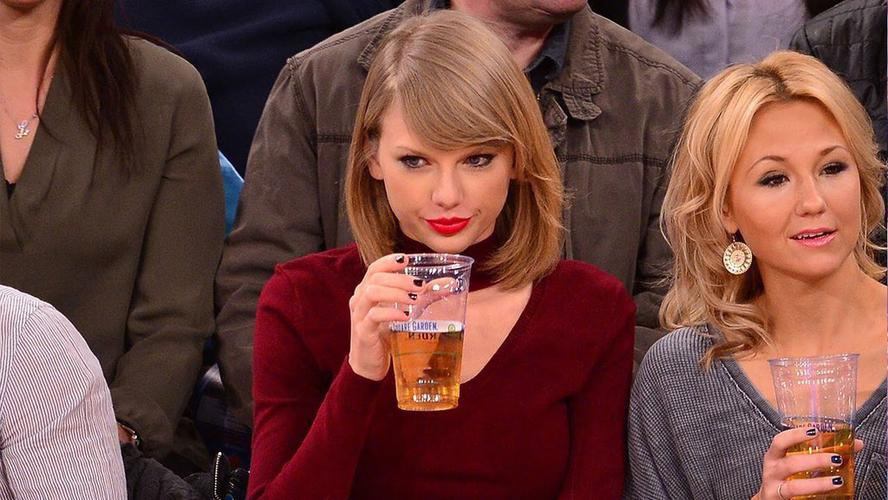

['clear', 'cakes', 'on', 'it', '<end>']


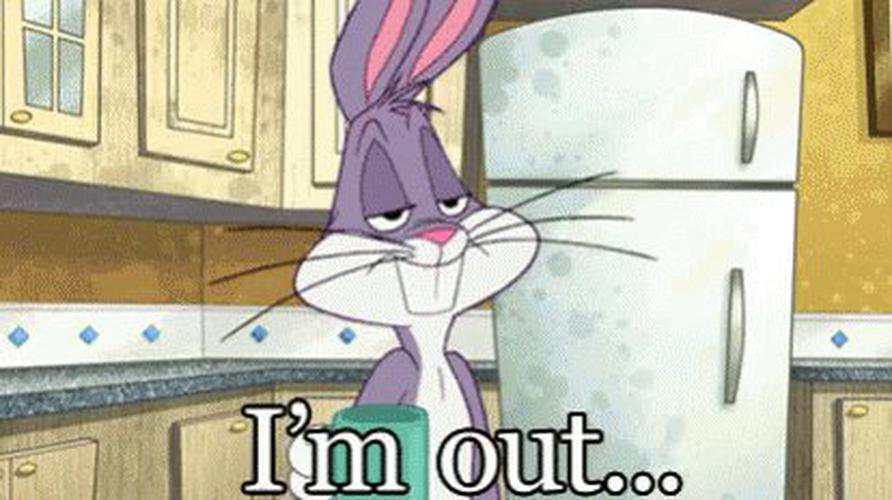

['a', '<unk>', 'surrounded', 'by', 'people', '<end>']


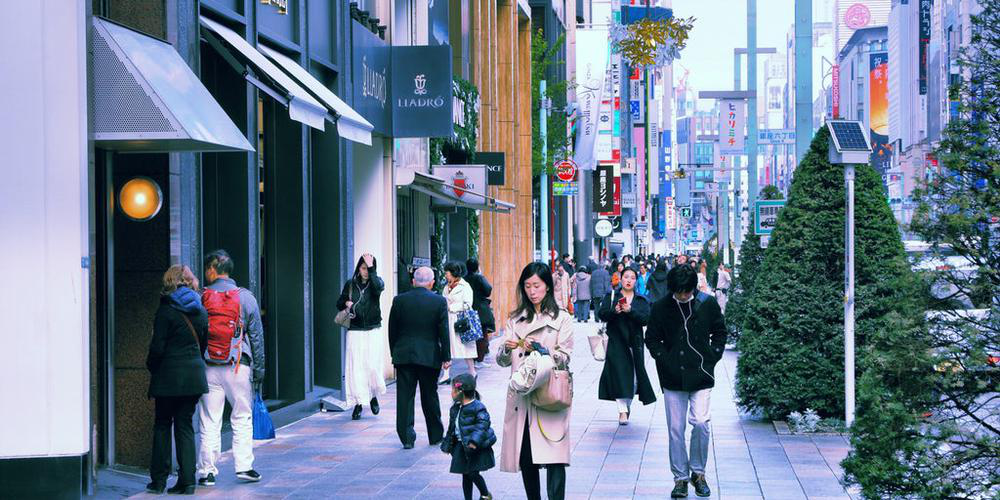

['the', 'poster', 'has', 'a', 'remote', 'next', 'to', '<unk>', 'and', 'images', '<end>']


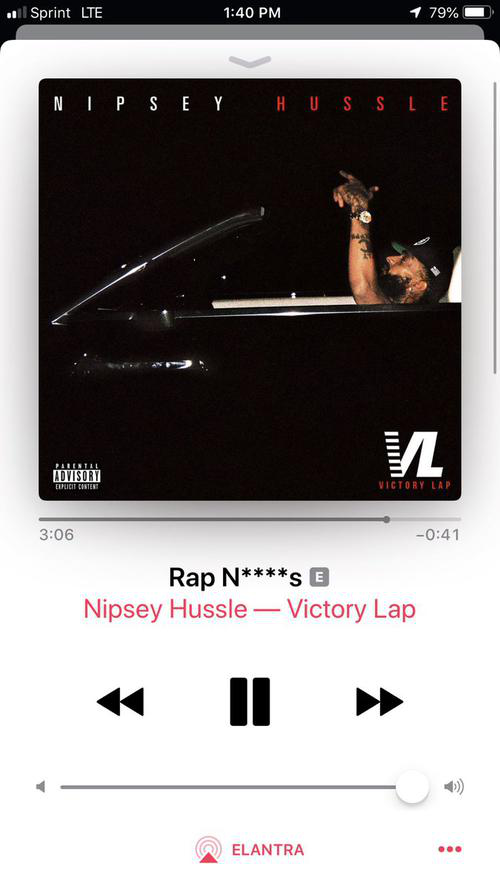

['a', 'group', 'of', 'people', 'are', 'on', 'the', 'street', '<end>']


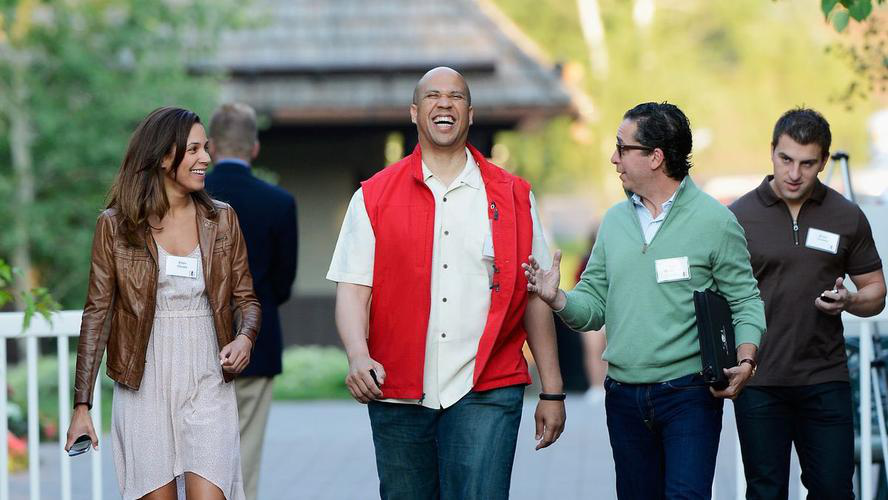

['a', 'herd', 'of', 'sheep', 'grazing', 'on', 'the', 'grass', '<end>']


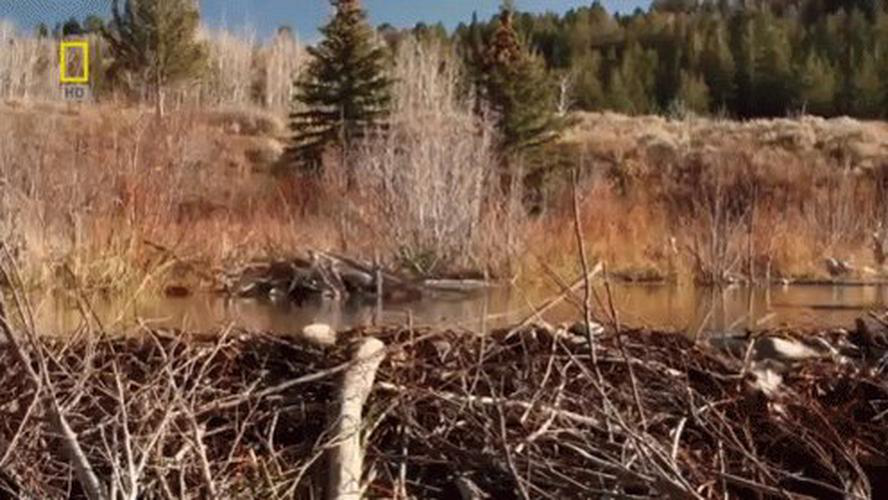

['a', 'man', 'in', 'a', '<unk>', 'eating', 'pink', 'tooth', 'brush', '<end>']


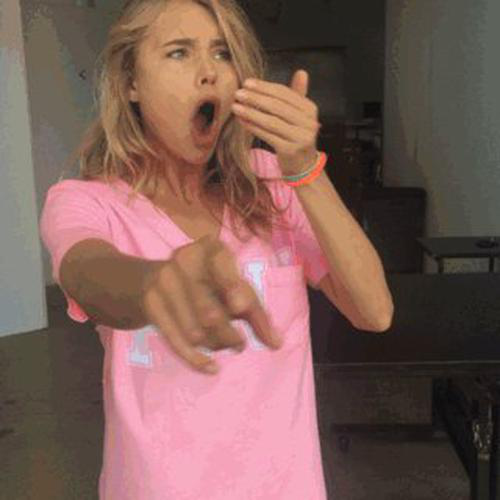

['a', 'tiny', 'tie', 'and', 'a', 'building', '<end>']


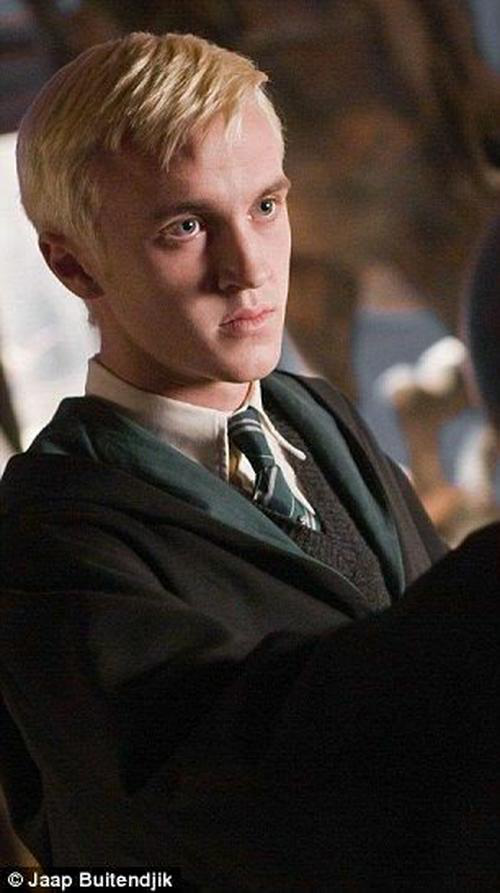

['a', 'man', 'holding', 'a', 'glass', 'of', 'wine', 'glass', '<end>']


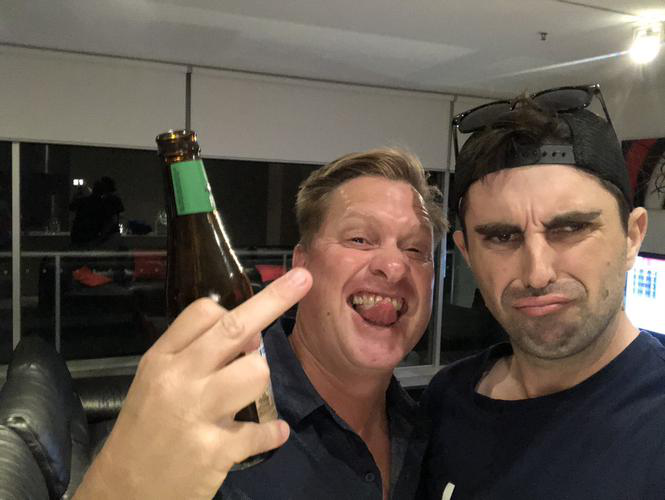

['a', 'man', 'wearing', 'a', 'shirt', 'and', 'shirt', 'drinking', 'something', '<end>']


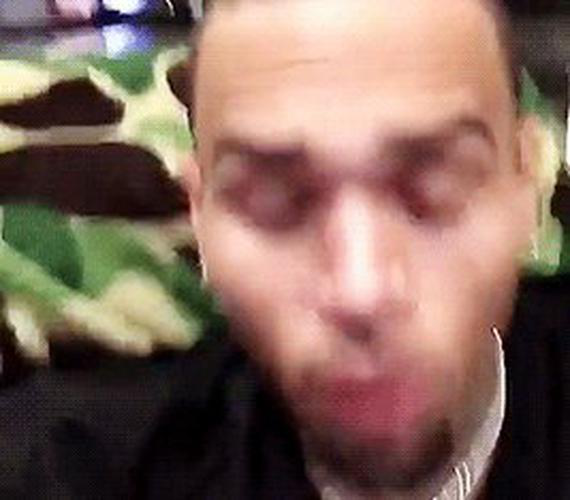

['a', 'woman', 'leans', 'on', 'a', 'refrigerator', 'and', 'men', '<end>']


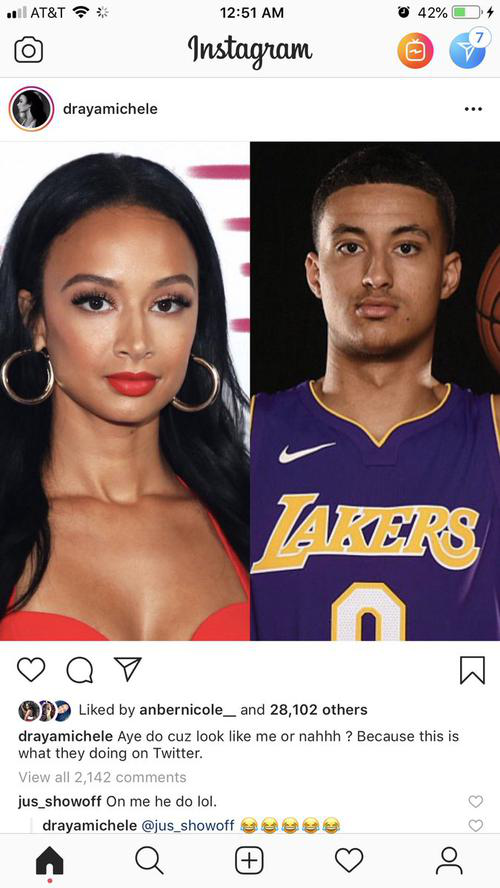

['a', 'man', 'wearing', 'a', 'hat', 'sitting', 'on', 'the', 'street', '<end>']


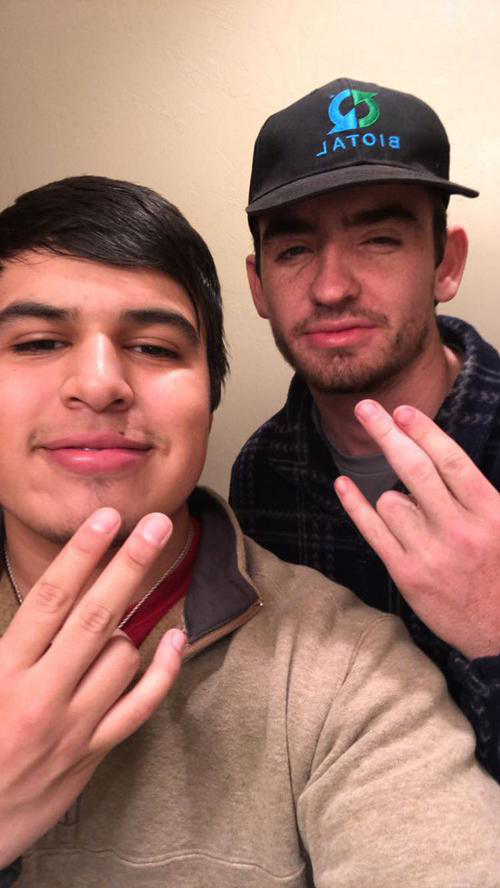

['little', 'girl', 'sitting', 'in', 'the', 'doorway', 'of', 'tin', '<end>']


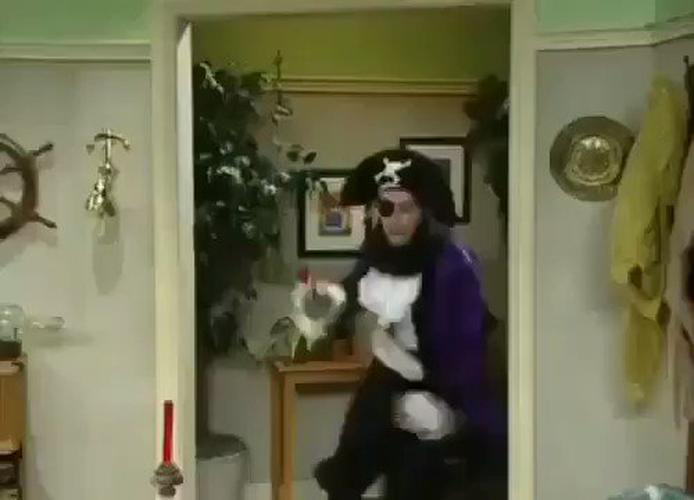

In [35]:
for f in os.listdir('../mmhs150k/img_resized')[:25]:
    result = evaluate_fast('../mmhs150k/img_resized/' + f)
    print(result)
    display(Image.open('../mmhs150k/img_resized/' + f))

In [ ]:
import pickle
from tqdm import tqdm

caption_dict = dict()
for f in tqdm(os.listdir('../mmhs150k/img_resized')):
    ID = f.split('.')[0]
    result, _ = evaluate('../mmhs150k/img_resized/' + f)
    
    caption_dict[ID] = result
    
print(len(caption_dict))
pickle.dump(caption_dict, open('caption_dict_all.pkl', 'wb'))

  5%|▍         | 7188/150000 [29:55<10:02:39,  3.95it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 19%|█▊        | 28111/150000 [1:57:11<8:12:41,  4.12it/s] 